# Practical Bioinformatics / HW9 - Secondary structure of RNA

1. **Get a tertiary structure of tRNA**

1.1 Download the PDB structure file (ID is specified in the table) and open it in PyMOL.

PyMOL can be installed on a laptop via this link https://pymol.org/2/#download. I've installed 2.5 version of it.

Btw, PyMOL is used for the molecular visualization.
_____________________________
The Protein Data Bank (PDB) was established at Brookhaven National Laboratories (BNL) in 1971 as an archive for biological macromolecular crystal structures. In the beginning the archive held seven structures, and with each year a handful more were deposited.

PDB is a very important database when it comes to the areas of structural biology. Structures in PDB have wide applications. They can be used for various studies including identification of new protein structures via in silico approaches or can be used for protein–nucleic acid interaction studies.

The link to the PDB website is https://www.rcsb.org.

______________________
It is possible to find any protein structure by ID; ID of my interest is "1F7V". 


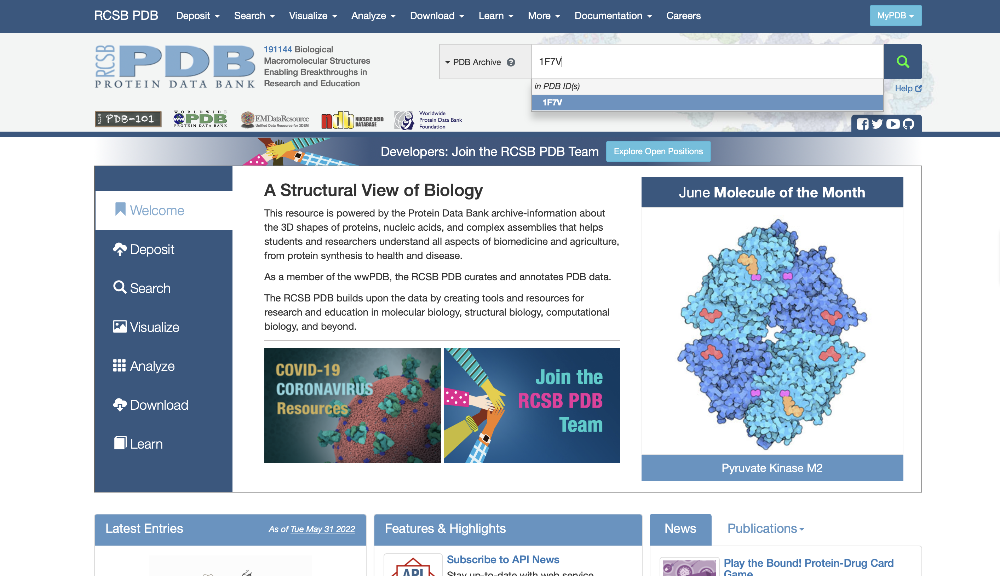

So, then, we get this searching result:

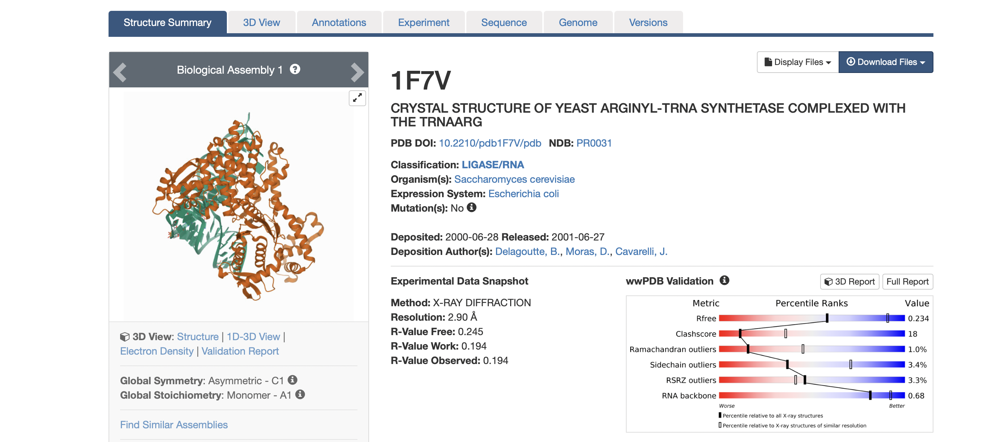

and we can download the PDB file ("Download Files" button -> PDB format).

Let's then open this file in PyMOL locally via "File -> Open -> 1f7v.pdb". As a result, we get such structure:

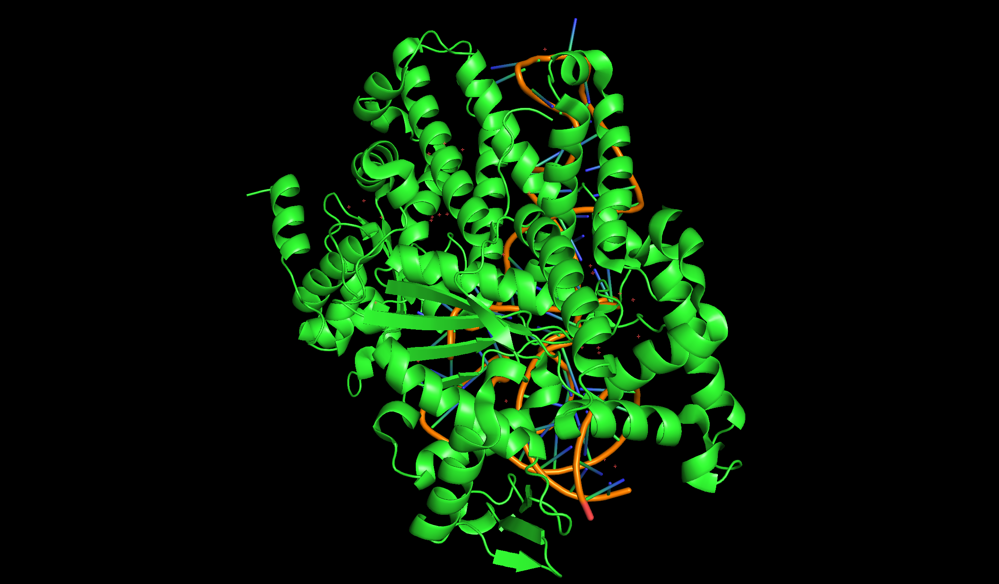

1.2 Remove all RNA chains except one (which one to keep is indicated in the table) -> this one (for my interest) is "B".
__________
"1f7v" has two chains (A and B) as we may see on the specified PDB section of it:

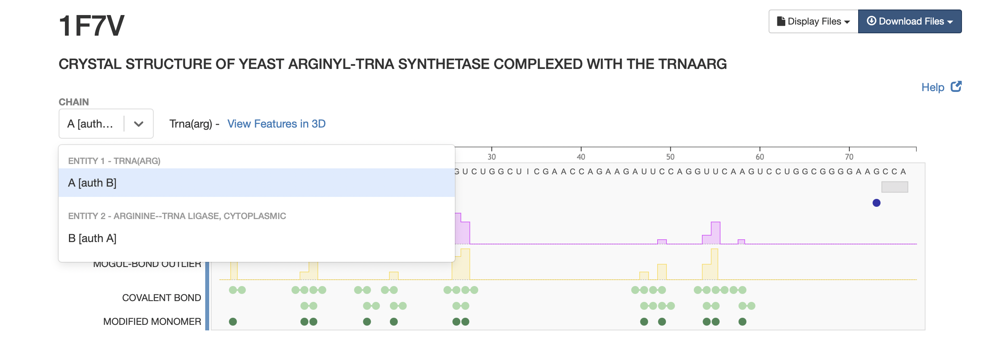

so we need to delete chain A and keep chain B.


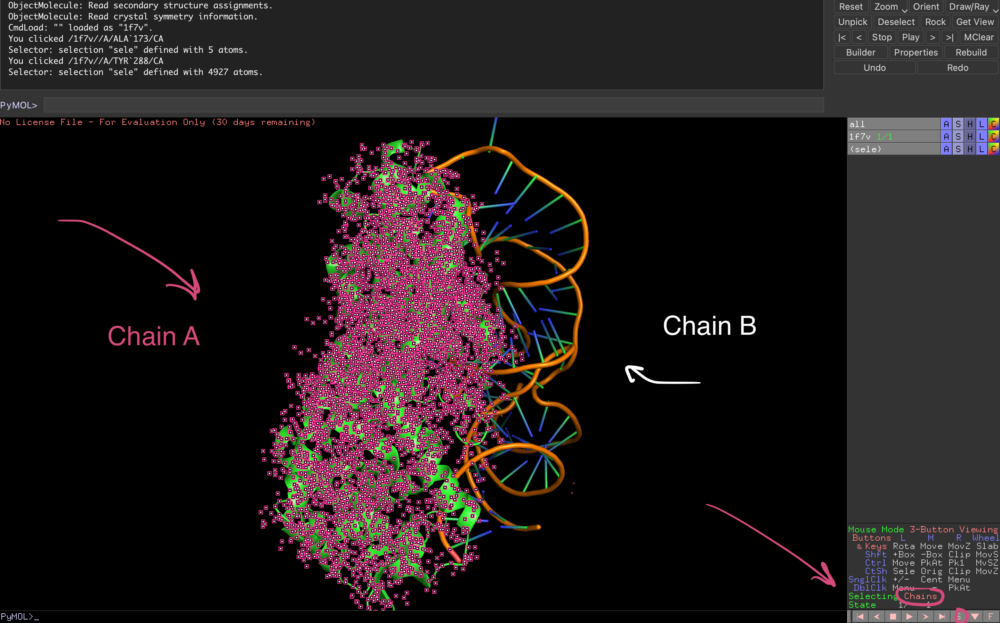

*Description to the figure above (how I deleted chain A)*:

At first I have clicked on "S" (the bottom right panel), and it shows the chains/ amino acid residues present in this structure; then 've selected "Chains" instead of "Residues" (the bottom right panel); after that, I've selected chain A that should be removed (honestly, I've checked it by PDB info. (at https://www.rcsb.org/3d-sequence/1F7V)). Finally (it's not seen on the figure above) I've went to the top right panel, here we see three rows including "(sele)", so, I've clicked on "A" (means action) for "(sele)" that shows a small window, and 've selected "remove atoms", and it removed the selected chain A. 


..Or easier way to delete chain A: run the command "remove 1F7V and chain A" in PyMOL.

1.3 Save the result into a separated PDB file (we will need it later):

just go to "File –> Export Molecule –> PDB Options (the parameters were default) -> Save (choose the pdb format)" (the output: new file "1f7v_b.pdb").

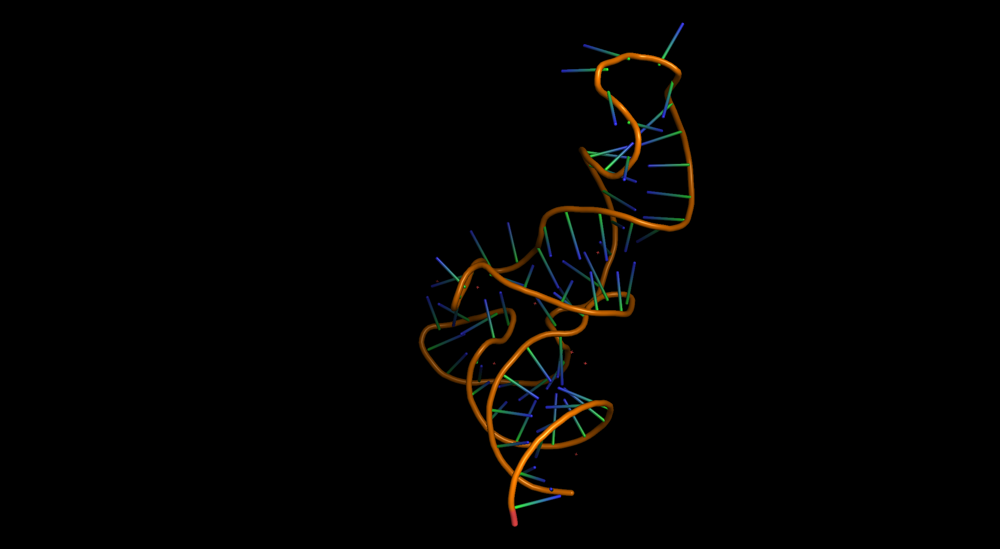

1.4 Paint the bases in different colors.

- to display the bases, use the command: "set cartoon_ring_mode, 3" in Pymol:

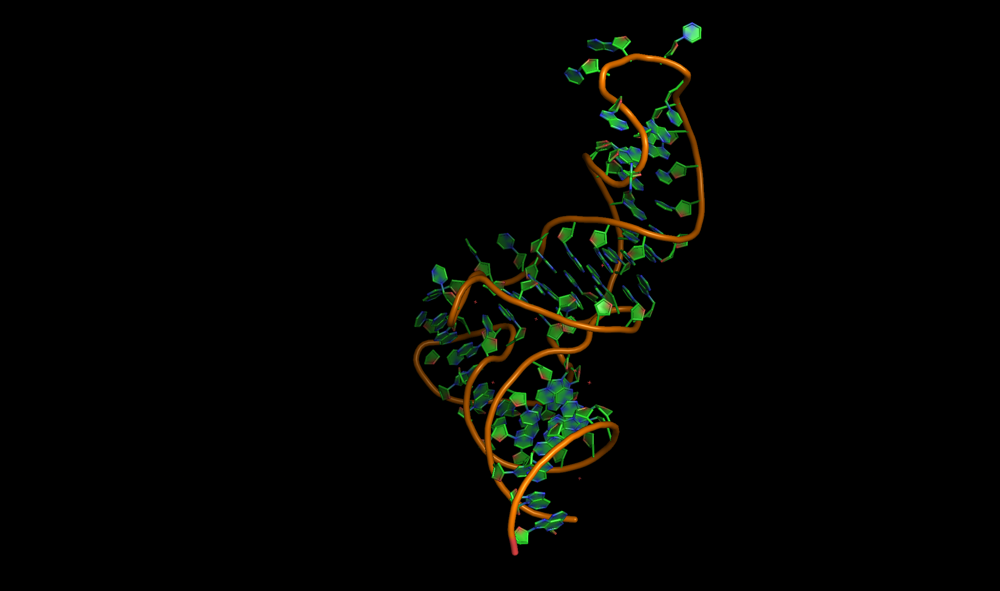

- to select bases by name, we need, for example, to run the command "select resn G" which will select all atoms of guanine;
- then, for coloring of this selection, we need to click on the "C" (means color) button on the top right panel for "(sele)") (I've chosen yellow for guanine) [here is the first way to color];
- to color A,C,U by the command "color [color name], sele" [the second way to color]:

for example (for A): "select resn A", "color white, sele".

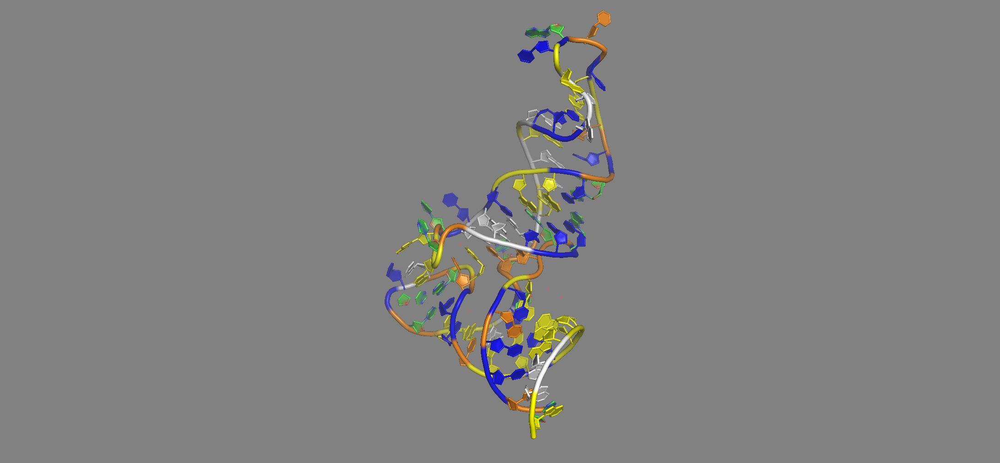

1.5 Paint all the other bases in another color. What was painted?

hint: pymol supports logical operators.

In [ ]:
# The commands that I've launched:
# select resn A+G+C+U
# color pink, not sele

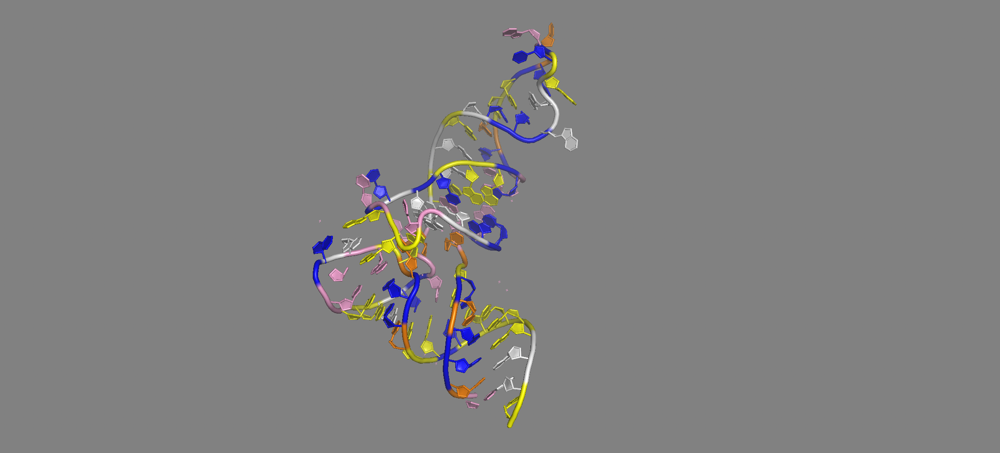

R: Modified nucleotides are painted pink.

In all living organisms, RNA molecules of various types undergo post-transcriptional modifications. 

Only by the end of the last century, the number of known natural modifications of the four main ribonucleotides exceeded one hundred.

Great article about that (it is better explained here) is http://www.chem.msu.su/rus/vmgu/122/119.pdf.

1.6 Save image from PyMOL.
___________
It is possible to do by "File -> Export Image As -> PNG -> Draw/Ray (on the top right section) -> Draw (fast) -> Save Image to File".

2. **Obtaining of the RNA secondary structure using rna-fold**

2.1 Find the sequence on the PDB website or extract it from a file.
________
To obtain fasta file of the structure, it is need to run the command "save filename.fasta" in PyMOL (btw, it is possible to use such commands as "pwd", "cd" here to know in which directory a file will be saved); I've got "1f7v.fasta".

2.2. Obtain a secondary RNA structure using rna-fold (RNAWebSuite (http://rna.tbi.univie.ac.at/cgi-bin/RNAWebSuite/RNAfold.cgi) or ViennaRnaPackage (https://www.tbi.univie.ac.at/RNA/#download)). In the parameters, "prohibit GU at the ends" and leave the rest ones by default.
___________
I've chosen RNAWebSuite and select "no GU pairs at the end of helices" option then.

2.3 Save the structure picture obtained from the output of RNAWebSuite.

Below the minimum free energy (MFE) plain structure drawing is shown.


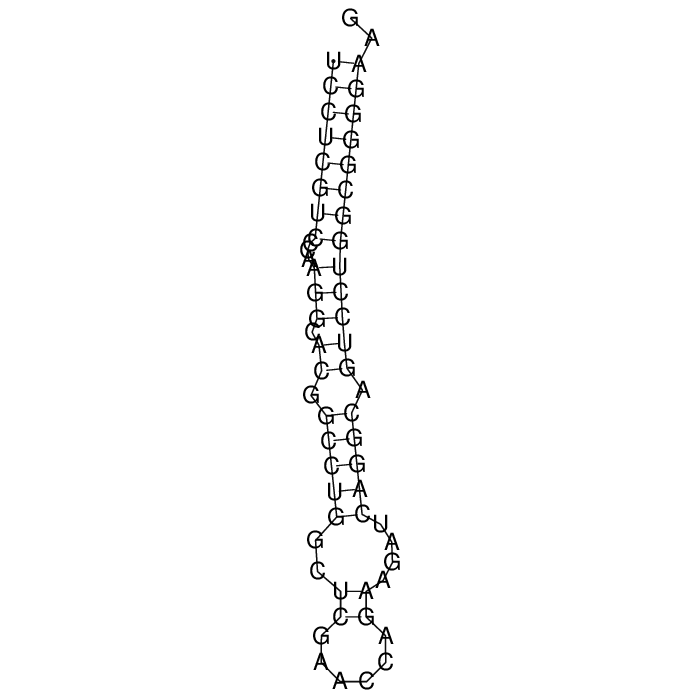

2.4 In accordance with the prediction, color the hairpin loops in pymol.
______________
From RNAWebSuite, the results for minimum free energy prediction:

The optimal secondary structure in dot-bracket notation with a minimum free energy of -24.30 kcal/mol is given below

UCCUCGUCCCAAGGCACGGCCUGGCUCGAACCAGAAGAUCAGGCAGUCCUGGCGGGGAAG

((((((((...(((.((.(((((..((......))....))))).)))))))))))))..

More inf. about dot-bracket notation (dbn) is explained here https://eternagame.fandom.com/wiki/Dot-Bracket_Notation.

It is possible to color 1) by selecting sections of the sequence manually (it is convenient to do this through sequence view, which is switched on by clicking on "S" at the bottom right section), 2) by using "set seq_view, 1" command) or 3) by writing a script that converts the bracket formula of the structure into coordinates.

In [ ]:
dbn = "((((((((...(((.((.(((((..((......))....))))).))))))))))))).."
print(len(dbn)/2) # middle
# So, the hairpin coordinates are 28-33.
# ps: neglect to count modifications (colored pink)

30.0


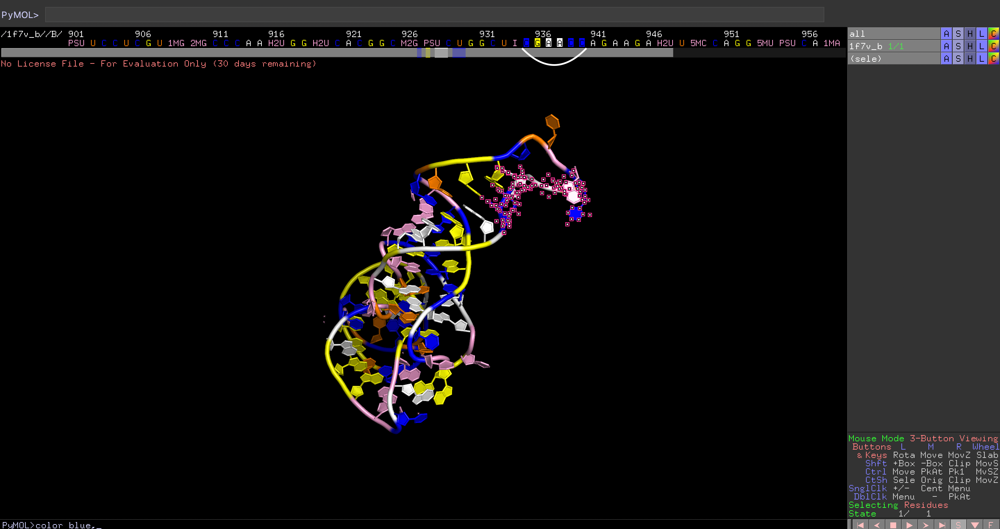

2.5 Save the image.
_______
p.s. on this image which is below the hairpin loops are colored cyan.

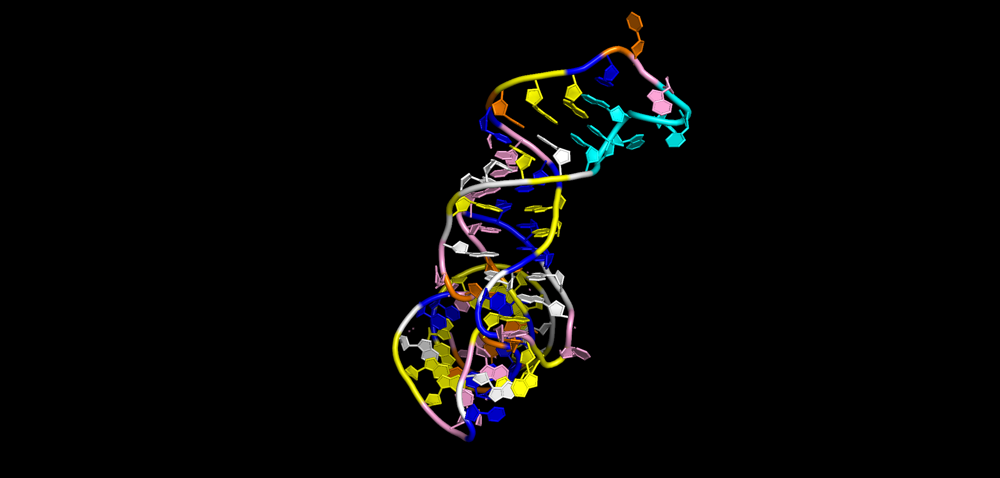

3. **Comparison of prediction with structure from database**

3.1 Recover 2D from 3D using RNApdbee 2.0 (http://rnapdbee.cs.put.poznan.pl).

RNApdbee is used for RNA secondary structure annotation based on PDB/mmCIF files.

To select "3D Mode → (....)" and in "Upload RNA 3D structure" to specify the file from task 1.3 with the default parameters.

On the left side of the website in the "Help" section, there are links to the articles describing algorithms and the table describing non-standard relationships that may be in the structure.

3.2 Save picture from the output results of RNApdbee.


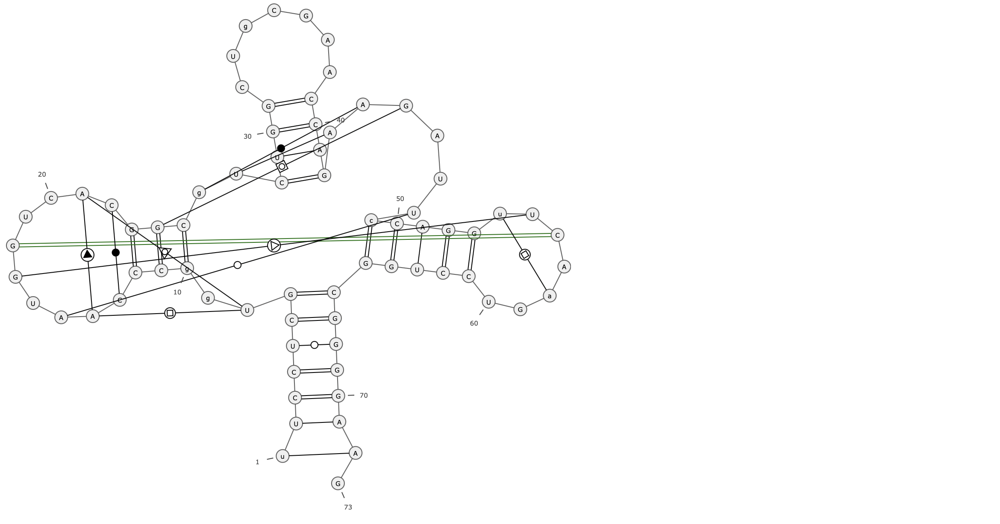

3.3 Do analysis of the results and compare the prediction (from step 2.2.) with the results (from step 3.1) using dot-bracket notation, 2D and 3D representations. 
_______________
The RNAWebSuite's result differs completely from the RNApdbee's one.

If we also compare the dot-bracket notation retrieved from the RNAWebSuite results with RNApdbee ones,

((((((((...(((.((.(((((..((......))....))))).)))))))))))))..

.((((((..(((.....[....)))..((((.......))))......(((((..]....)))))))))))..

they have relatively unsimilar structure (even the length of the hairpin loops).

3.4 Did the prediction turn out to be a classic "clover leaf" of tRNA? 

more inf. about "classic "clover leaf" of tRNA" is here https://rfam.xfam.org/family/RF00005#tabview=tab3.

Why do you think this happened?
____________

Partially, i.e. the result of RNApdbee completely looks like a classic "clover leaf" (of tRNA) while the RNAWebSuite's one is not.

Why this happened: I suppose this is because of different fold algorithms application (RNAWebSuite uses minimum free energy (MFE) and partition function, while RNApdbee - Hybrid Algorithm).

________________
Additional tasks:

Using the functions from the Vienna package and/or its online version, find the 10 best suboptimal RNA structures (subopt), draw them (RNAplot), build a tree (barriers). Did the "shamrocks" turn out?

___________
How to run this package, more inf. is here https://github.com/ViennaRNA/ViennaRNA.

At first, let's install source code (.tar.gz) from the official website (the link is attached above).

In [ ]:
!tar -zxvf ViennaRNA-2.5.1.tar.gz
!cd ViennaRNA-2.5.1 && ./configure && make && make install

checking for gcc... gcc
checking whether the C compiler works... yes
checking for C compiler default output file name... a.out
checking for suffix of executables... 
checking whether we are cross compiling... no
checking for suffix of object files... o
checking whether the compiler supports GNU C... yes
checking whether gcc accepts -g... yes
checking for gcc option to enable C11 features... none needed
checking whether gcc understands -c and -o together... yes
checking for stdio.h... yes
checking for stdlib.h... yes
checking for string.h... yes
checking for inttypes.h... yes
checking for stdint.h... yes
checking for strings.h... yes
checking for sys/stat.h... yes
checking for sys/types.h... yes
checking for unistd.h... yes
checking for wchar.h... yes
checking for minix/config.h... no
checking whether it is safe to define __EXTENSIONS__... yes
checking whether _XOPEN_SOURCE should be defined... no
checking whether make supports nested variables... yes
checking for a BSD-compatible insta

________
more inf. about each command is here https://www.tbi.univie.ac.at/RNA/documentation.html.

In [ ]:
# at first, let's run "RNAsubopt" command (to calculate suboptimal secondary structures of RNAs):
seq = "?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG"
# this is retrieved from 1f7v_b.fasta (from pdb)

In [ ]:
!RNAsubopt −−noClosingGU -e2 <<<{seq}
# −−noClosingGU - Do not allow GU pairs at the end of helices (default=off) -> as for RNAWebSuite parameters choice
# -e2 - to increase the number output structures to more than 10..
# −e, −−deltaEnergy=range

?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG -15.20   2.00
.((((((....................((((.......)))).......((((.......)))).)))))).. -13.60
.((((((...((....)).........((((.......)))).......((((.......)))).)))))).. -13.50
.((((((....((.........))...((((.......)))).......((((.......)))).)))))).. -13.60
.(((((((........((....(((.....))).....)).........((((.......))))))))))).. -13.30
.(((((((...................((((.......)))).......((((.......))))))))))).. -15.20
.(((((((...((...)).........((((.......)))).......((((.......))))))))))).. -14.70
.(((((((..((....)).........((((.......)))).......((((.......))))))))))).. -15.10
.(((((((........(....).....((((.......)))).......((((.......))))))))))).. -14.40
.(((((((...((.........))...((((.......)))).......((((.......))))))))))).. -15.20
.(((((((...((...(....)))...((((.......)))).......((((.......))))))))))).. -13.80
.(((((((..((..........))...((((.......)))).......((((.......))))))))))).. -14.50
.(((((((..((....(....

In [ ]:
# create files for the next step:
# file 1
!touch seq1.txt && echo ">seq1" > seq1.txt && echo "?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG" >> seq1.txt && echo ".((((((....................((((.......)))).......((((.......)))).)))))).." >> seq1.txt && cat seq1.txt
# file 2
!touch seq2.txt && echo ">seq2" > seq2.txt && echo "?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG" >> seq2.txt && echo ".((((((...((....)).........((((.......)))).......((((.......)))).)))))).." >> seq2.txt && cat seq2.txt
# file 3
!touch seq3.txt && echo ">seq3" > seq3.txt && echo "?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG" >> seq3.txt && echo ".((((((....((.........))...((((.......)))).......((((.......)))).)))))).." >> seq3.txt && cat seq3.txt
# file 4
!touch seq4.txt && echo ">seq4" > seq4.txt && echo "?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG" >> seq4.txt && echo ".(((((((........((....(((.....))).....)).........((((.......))))))))))).." >> seq4.txt && cat seq4.txt
# file 5
!touch seq5.txt && echo ">seq5" > seq5.txt && echo "?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG" >> seq5.txt && echo ".(((((((...................((((.......)))).......((((.......))))))))))).." >> seq5.txt && cat seq5.txt
# file 6
!touch seq6.txt && echo ">seq6" > seq6.txt && echo "?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG" >> seq6.txt && echo ".(((((((...((...)).........((((.......)))).......((((.......))))))))))).." >> seq6.txt && cat seq6.txt
# file 7
!touch seq7.txt && echo ">seq7" > seq7.txt && echo "?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG" >> seq7.txt && echo ".(((((((..((....)).........((((.......)))).......((((.......))))))))))).." >> seq7.txt && cat seq7.txt
# file 8
!touch seq8.txt && echo ">seq8" > seq8.txt && echo "?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG" >> seq8.txt && echo ".(((((((........(....).....((((.......)))).......((((.......))))))))))).." >> seq8.txt && cat seq8.txt
# file 9
!touch seq9.txt && echo ">seq9" > seq9.txt && echo "?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG" >> seq9.txt && echo ".(((((((...((.........))...((((.......)))).......((((.......))))))))))).." >> seq9.txt && cat seq9.txt
# file 10
!touch seq10.txt && echo ">seq10" > seq10.txt && echo "?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG" >> seq10.txt && echo ".(((((((...((...(....)))...((((.......)))).......((((.......))))))))))).." >> seq10.txt && cat seq10.txt


>seq10
?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG
.(((((((...((...(....)))...((((.......)))).......((((.......)))))))))))..


In [ ]:
# then, let's run "RNAplot" (to draw RNA Secondary Structures in PostScript, SVG, or GML)
!cat seq1.txt | RNAplot -o svg
!cat seq2.txt | RNAplot -o svg
!cat seq3.txt | RNAplot -o svg
!cat seq4.txt | RNAplot -o svg
!cat seq5.txt | RNAplot -o svg
!cat seq6.txt | RNAplot -o svg
!cat seq7.txt | RNAplot -o svg
!cat seq8.txt | RNAplot -o svg
!cat seq9.txt | RNAplot -o svg
!cat seq10.txt | RNAplot -o svg

In [ ]:
# to convert svg to png
!pip3 install cairosvg

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 45 kB 2.5 MB/s 
     |████████████████████████████████| 88 kB 6.5 MB/s 
  Created wheel for cairocffi: filename=cairocffi-1.3.0-py3-none-any.whl size=89668 sha256=7e32fbf4a77b4a8251dcd8a6f961380a2afee1479b183308848e400a0917c051
  Stored in directory: /root/.cache/pip/wheels/4e/ca/e1/5c8a9692a27f639a07c949044bec943f26c81cd53d3805319f
Successfully built cairocffi


In [ ]:
import cairosvg

width = 640
height = 480
cairosvg.svg2png(url='seq1_ss.svg', write_to='seq1.png', output_width=width, output_height=height)
cairosvg.svg2png(url='seq2_ss.svg', write_to='seq2.png', output_width=width, output_height=height)
cairosvg.svg2png(url='seq3_ss.svg', write_to='seq3.png', output_width=width, output_height=height)
cairosvg.svg2png(url='seq4_ss.svg', write_to='seq4.png', output_width=width, output_height=height)
cairosvg.svg2png(url='seq5_ss.svg', write_to='seq5.png', output_width=width, output_height=height)
cairosvg.svg2png(url='seq6_ss.svg', write_to='seq6.png', output_width=width, output_height=height)
cairosvg.svg2png(url='seq7_ss.svg', write_to='seq7.png', output_width=width, output_height=height)
cairosvg.svg2png(url='seq8_ss.svg', write_to='seq8.png', output_width=width, output_height=height)
cairosvg.svg2png(url='seq9_ss.svg', write_to='seq9.png', output_width=width, output_height=height)
cairosvg.svg2png(url='seq10_ss.svg', write_to='seq10.png', output_width=width, output_height=height)

As a result we get the first 10 structures by RNAsubopt -> RNAplot:
________
Structure 1

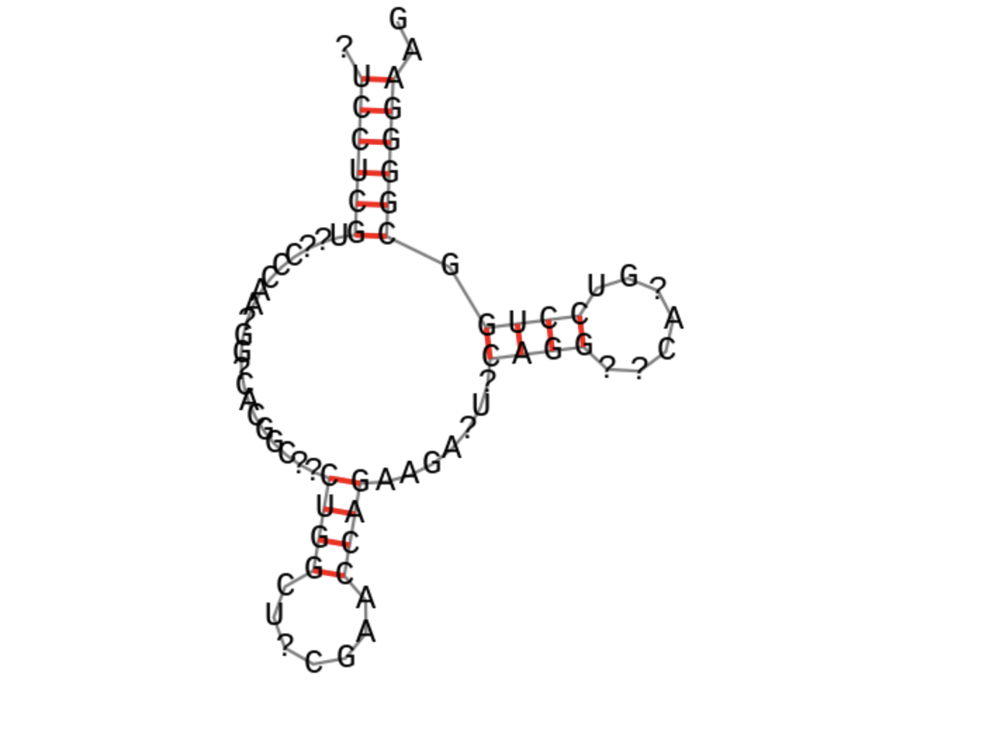

Structure 2

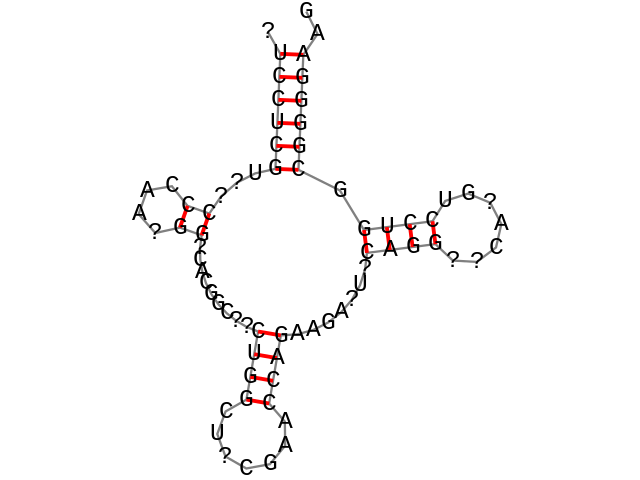

Structure 3

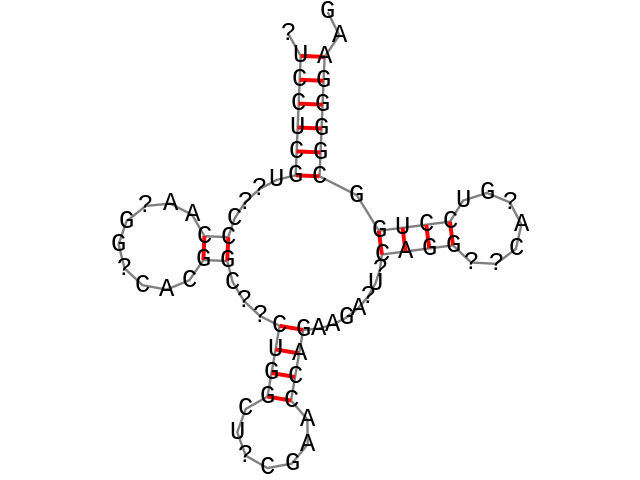

Structure 4

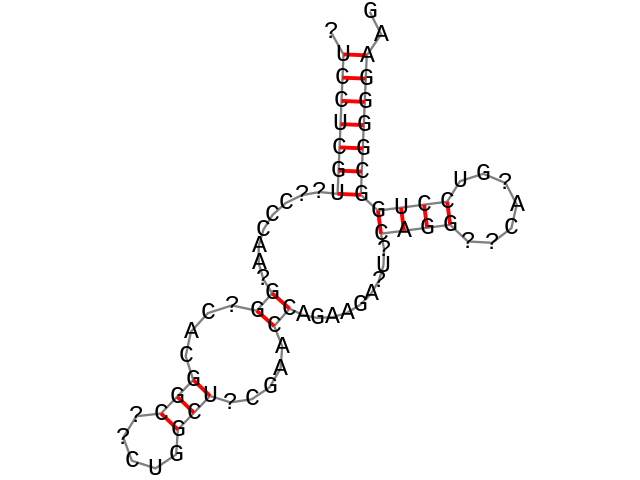

Structure 5

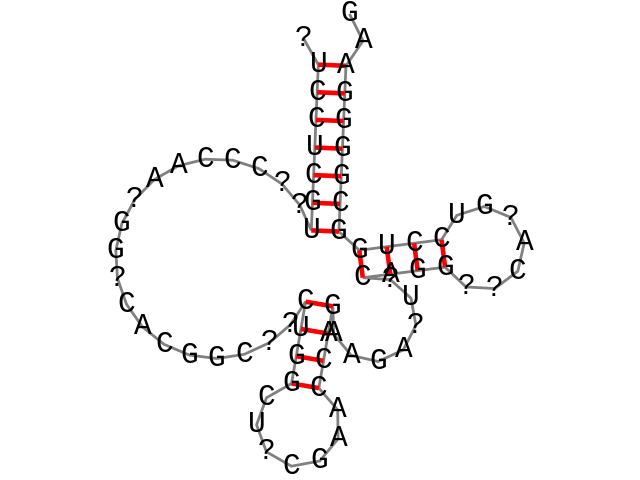

Structure 6

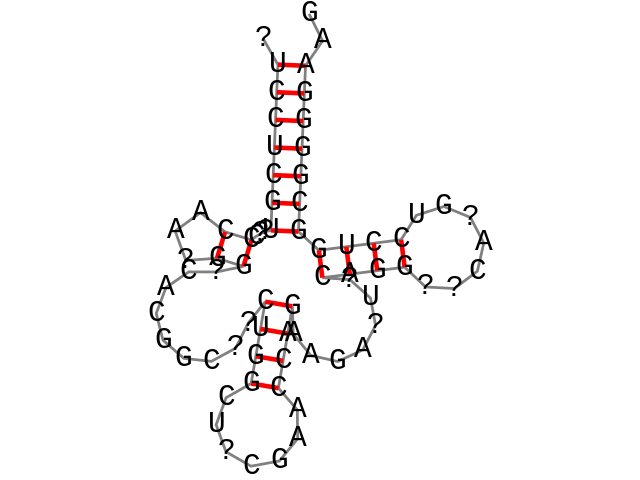

Structure 7

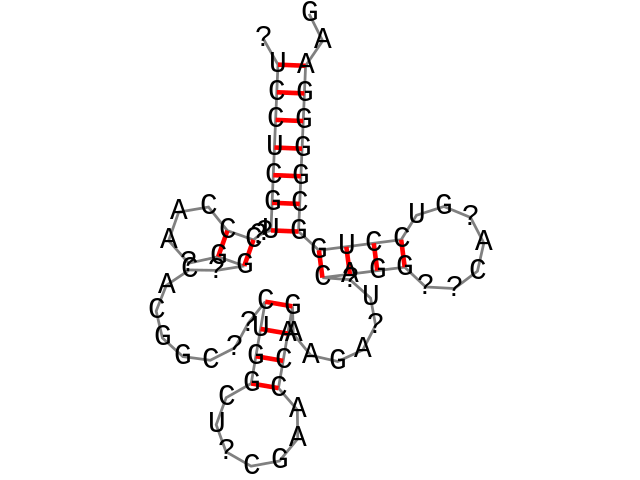

Structure 8

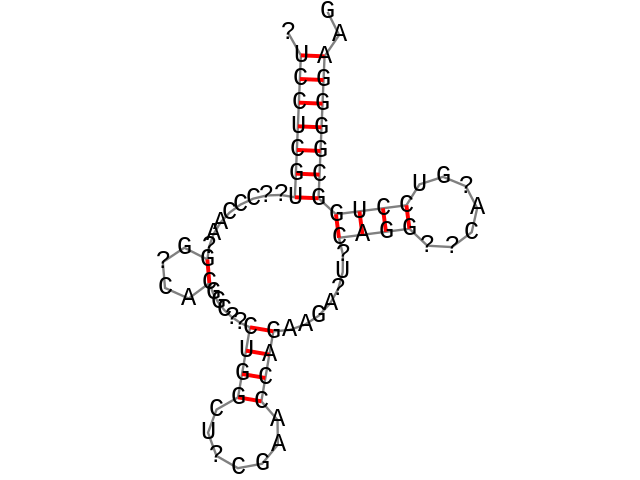

Structure 9

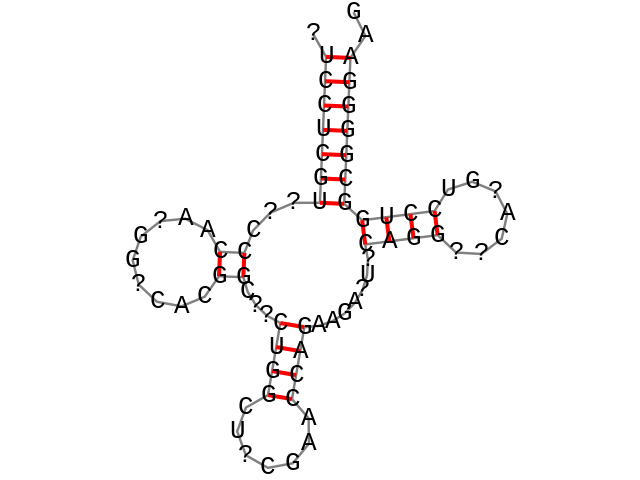

Structure 10

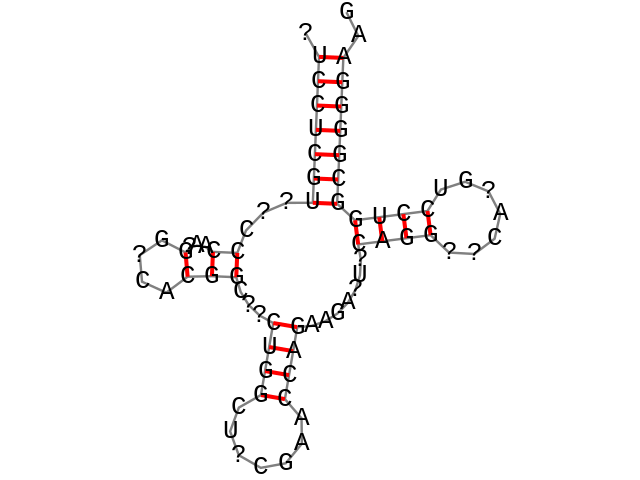

Did the "shamrocks" turn out?
___________________

As we may see, almost all ten structures (except Structure 4) look like "shamrocks".

In [93]:
# finally, let's build a tree (barriers)
# more inf. how to do that - https://www.tbi.univie.ac.at/RNA/tutorial/ in the section "barriers and treekin"
#######
# get the barriers source from http://www.tbi.univie.ac.at/RNA/Barriers/
!wget https://www.tbi.univie.ac.at/RNA/download/sourcecode/1_8_x/Barriers-1.8.1.tar.gz
!tar -xzf Barriers-1.8.1.tar.gz
!cd Barriers-1.8.1 && ./configure --prefix=$HOME/Tutorial/Progs/barriers-1.8.1 && make && make install

checking whether make supports nested variables... yes
checking for a BSD-compatible install... /usr/bin/install -c
checking whether build environment is sane... yes
checking for a thread-safe mkdir -p... /bin/mkdir -p
checking for gawk... no
checking for mawk... mawk
checking whether make sets $(MAKE)... yes
checking whether make supports the include directive... yes (GNU style)
checking for gcc... gcc
checking whether the C compiler works... yes
checking for C compiler default output file name... a.out
checking for suffix of executables... 
checking whether we are cross compiling... no
checking for suffix of object files... o
checking whether we are using the GNU C compiler... yes
checking whether gcc accepts -g... yes
checking for gcc option to accept ISO C89... none needed
checking whether gcc understands -c and -o together... yes
checking dependency style of gcc... gcc3
checking how to run the C preprocessor... gcc -E
checking for grep that handles long lines and -e... /bin/grep
c

In [102]:
# data preparation
print(seq)

?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG


In [165]:
!echo {seq} | RNAsubopt --noLP -s -e 1.6 > barseq.sub 
# -e 1.6 (to get 10 structures exactly (by enumeration))
!mv barseq.sub ~/Tutorial/Progs/barriers-1.8.1/bin # to run the next command correctly

In [166]:
!cat ~/Tutorial/Progs/barriers-1.8.1/bin/barseq.sub

?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG -15.20   1.60
.(((((((...((.........))...((((.......)))).......((((.......))))))))))).. -15.20
.(((((((...................((((.......)))).......((((.......))))))))))).. -15.20
.(((((((..((....)).........((((.......)))).......((((.......))))))))))).. -15.10
.(((((((...((...)).........((((.......)))).......((((.......))))))))))).. -14.70
.(((((((..((..........))...((((.......)))).......((((.......))))))))))).. -14.50
..((((((...((.........))...((((.......)))).......((((.......))))))))))... -14.00
..((((((...................((((.......)))).......((((.......))))))))))... -14.00
..((((((..((....)).........((((.......)))).......((((.......))))))))))... -13.90
.((((((....((.........))...((((.......)))).......((((.......)))).)))))).. -13.60
.((((((....................((((.......)))).......((((.......)))).)))))).. -13.60


In [131]:
!cd ~/Tutorial/Progs/barriers-1.8.1/bin && ./barriers -h
# so, we see the visualisation is represented by "tree.ps" file

Usage: barriers [OPTION]... [[FILE]]...
Compute local minima and energy barriers of a landscape

This program reads an energy sorted list of conformations of a landscape, and
computes local minima and energy barriers of the landscape. For RNA secondary
structures, suitable input is produced by RNAsubopt. For each local minimum
found it prints to stdout, the conformation of the minimum, its energy, the
number of the "parent"-minimum it merges with, and the height of the energy
barrier. Additional information on each minimum, such as saddle point
conformation and basin sizes can be included via options.

A PostScript drawing of the resulting tree is written to "tree.ps" in the
current directory.

  -h, --help                    Print help and exit
      --detailed-help           Print help, including all details and hidden
                                  options, and exit
      --full-help               Print help, including hidden options, and exit
  -V, --version                 Prin

In [175]:
# calculate the Barrier Tree
!cd ~/Tutorial/Progs/barriers-1.8.1/bin && ./barriers < barseq.sub > barseq.bar

tcmalloc: large alloc 1073741824 bytes == 0x557536356000 @  0x7f36bdbc6001 0x55753484cf26 0x5575348520c9 0x557534842e58 0x7f36bd423c87 0x55753484360a
hashbits = 27
tcmalloc: large alloc 8589934592 bytes == 0x557576356000 @  0x7f36bdbc6001 0x55753484cf26 0x557534845313 0x557534842e86 0x7f36bd423c87 0x55753484360a
Graph is RNA with noLP=0, Shift=0, ligand=0
read 10 structures, to find 0 saddles
0 hash table collisions


In [176]:
# outfile
!cat ~/Tutorial/Progs/barriers-1.8.1/bin/barseq.bar

     ?UCCUCGU??CCCAA?GG?CACGGC??CUGGCU?CGAACCAGAAGA?U?CAGG??CA?GUCCUGGCGGGGAAG
   1 .(((((((...((.........))...((((.......)))).......((((.......))))))))))).. -15.20    0   1.60
   2 .(((((((...................((((.......)))).......((((.......))))))))))).. -15.20    0   1.60
   3 .(((((((..((....)).........((((.......)))).......((((.......))))))))))).. -15.10    0   1.50
   4 .(((((((...((...)).........((((.......)))).......((((.......))))))))))).. -14.70    0   1.10
   5 .(((((((..((..........))...((((.......)))).......((((.......))))))))))).. -14.50    0   0.90


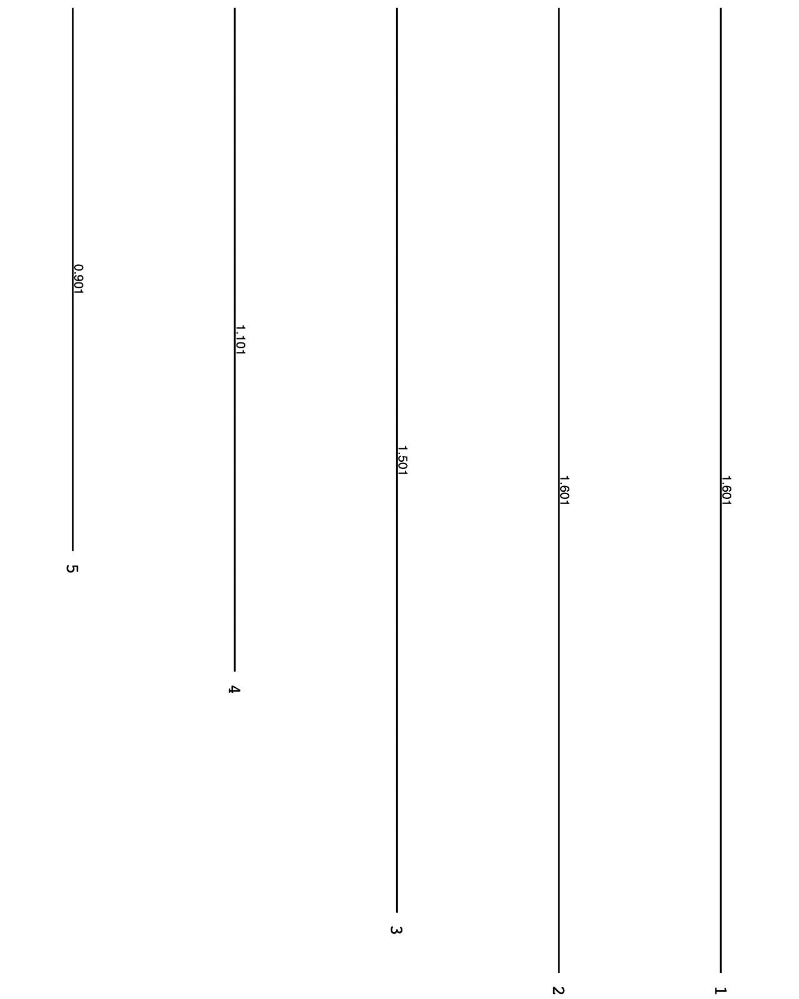

This is is incomprehensible (possibly strange) result 👽 (i mean, "barriers" section).

In [ ]:
####### pip install ViennaRNA --upgrade # (another way to instal ViennaRNA package). however, that was too long..